In [1]:
import sys, os

sys.path.append(os.path.abspath('../'))

import tensorflow as tf
import tensorflow_datasets as tfds
import quarks2cosmos.datasets

In [2]:
%pylab inline
import jax
import numpy as np
import jax.numpy as jnp
from astropy.table import Table

Populating the interactive namespace from numpy and matplotlib


## Load the MassiveNUs dataset

In [3]:
N_BATCH = 20
NOISE_STD = 0.15
N_map = 360

In [4]:
def load_dataset(batch_size, noise_dist_std, train_split):
    def pre_process(example):
        """ Pre-processing function preparing data for denoising task
        """
        # Cutout a portion of the map
        x = tf.expand_dims(example['map'], -1)
        x = tf.image.flip_left_right(x)
        x = tf.image.flip_up_down(x)

        # Apply image reampling to 256x256 but preserving
        x = tf.image.resize(x, [N_map, N_map], method=tf.image.ResizeMethod.AREA)
        # Sample random Gaussian noise
        u = tf.random.normal(tf.shape(x))
        # Sample standard deviation of noise corruption
        s = noise_dist_std * tf.random.normal((1, 1, 1))
        # Create noisy image
        y = x + s * u
        return {'x':x, 'y':y, 'u':u,'s':s}
    ds = tfds.load('MassiveNu', split=train_split)
    ds = ds.map(pre_process)
    ds = ds.batch(batch_size)
    return ds.as_numpy_iterator()

In [5]:
dset = load_dataset(N_BATCH, NOISE_STD, tfds.Split.TRAIN)

## Get the score network

In [6]:
# Ok, so now we just need to train 
from quarks2cosmos.models import SmallUResNet, SNParamsTree
import haiku as hk
import optax

In [7]:
model = hk.transform_with_state(lambda x, sigma, is_training=False: SmallUResNet()(x, sigma, is_training))

In [8]:
params, state = model.init(jax.random.PRNGKey(0), jnp.zeros([1,N_map,N_map,1]),jnp.zeros([1,1,1,1]), is_training=True)

In [9]:
def lr_schedule(step):
  """Linear scaling rule optimized for 90 epochs."""
  steps_per_epoch = 40000 // 32

  current_epoch = step / steps_per_epoch  # type: float
  lr = (1.0 * 32) / 32
  boundaries = jnp.array((20, 40, 60)) * steps_per_epoch
  values = jnp.array([1., 0.1, 0.01, 0.001]) * lr

  index = jnp.sum(boundaries < step)
  return jnp.take(values, index)

In [10]:
optimizer = optax.chain(
  optax.adam(learning_rate=1e-3),
  optax.scale_by_schedule(lr_schedule)
)
rng_seq = hk.PRNGSequence(42)

In [11]:
opt_state = optimizer.init(params)

In [12]:
sn_fn = hk.transform_with_state(lambda x: SNParamsTree(ignore_regex='[^?!.]*b$|[^?!.]*offset$',
                                                          val=1.)(x))

In [13]:
_, sn_state = sn_fn.init(next(rng_seq), params)

In [14]:
params, sn_state = sn_fn.apply(None, sn_state, None, params)

In [15]:
def loss_fn(params, state, rng_key, batch):
    score, state = model.apply(params, state, rng_key, batch['y'], batch['s'], is_training=True)
    loss = jnp.mean((batch['u'] + batch['s'] * (score))**2)
    return loss, state

In [16]:
@jax.jit
def update(params, state, sn_state, rng_key, opt_state, batch):
    (loss, state), grads = jax.value_and_grad(loss_fn, has_aux=True)(params, state, rng_key, batch)
    updates, new_opt_state = optimizer.update(grads, opt_state)
    new_params = optax.apply_updates(params, updates)
    new_params, new_sn_state = sn_fn.apply(None, sn_state, None, new_params)
    return loss, new_params, state, new_sn_state, new_opt_state

In [17]:
import pickle

In [61]:
N_BATCH = 20
NOISE_STD = 0.2

In [64]:
dset = load_dataset(N_BATCH, NOISE_STD, tfds.Split.TRAIN)

In [23]:
with open('../models/dm_score/model-1000.pckl', 'rb') as file:
    params, state, sn_state = pickle.load(file)

7001 0.02075106
7051 0.058472008
7101 0.020635795
7151 0.020396981
7201 0.07994776
7251 0.038905114
7301 0.04168679
7351 0.06536443
7401 0.05870669
7451 0.027756851


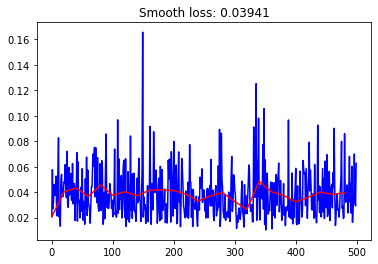

Loading dataset...
7501 0.02773584
7551 0.033465315
7601 0.020965993
7651 0.02332172
7701 0.01997283
7751 0.031336248
7801 0.07954209
7851 0.08136727
7901 0.027321847
7951 0.024479007


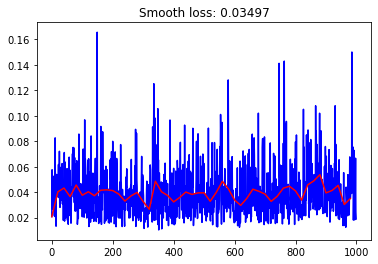

Loading dataset...
8001 0.066297434
8051 0.029475717
8101 0.013974656
8151 0.029069472
8201 0.040185913
8251 0.052922912
8301 0.049289864
8351 0.017257718
8401 0.02181672
8451 0.019483142


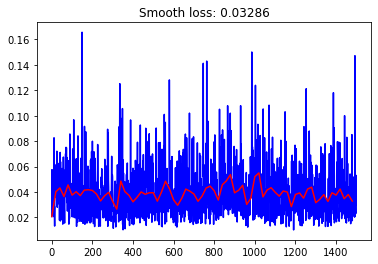

Loading dataset...
8501 0.06267054
8551 0.013928916
8601 0.045661915
8651 0.063797906
8701 0.02744693
8751 0.033103935
8801 0.05032337
8851 0.037178963
8901 0.027053606
8951 0.034320414


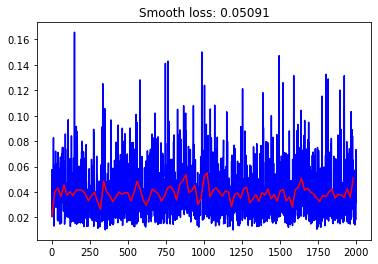

Loading dataset...
9001 0.032906078
9051 0.036629267
9101 0.037165422
9151 0.026226105
9201 0.06504585
9251 0.029190693
9301 0.11819273
9351 0.025606753
9401 0.037340473
9451 0.060735255


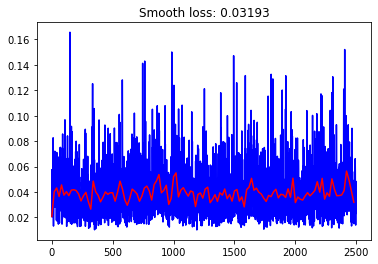

Loading dataset...
9501 0.03666137
9551 0.028569939
9601 0.023682782
9651 0.045844972
9701 0.061727382
9751 0.050391577
9801 0.065964855
9851 0.021237824
9901 0.026628582
9951 0.027983403


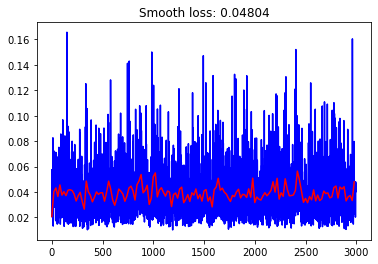

Loading dataset...
10001 0.017186599
10051 0.06927318
10101 0.050652165
10151 0.029106976
10201 0.019398145
10251 0.054957148
10301 0.09739199
10351 0.06755018
10401 0.021992683
10451 0.03247665


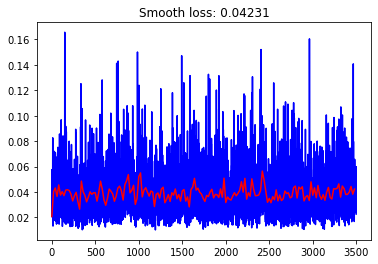

Loading dataset...
10501 0.024947114
10551 0.026161073
10601 0.05800656
10651 0.05218609
10701 0.019230848
10751 0.0416911
10801 0.0324982
10851 0.020945186
10901 0.031984027
10951 0.01801417


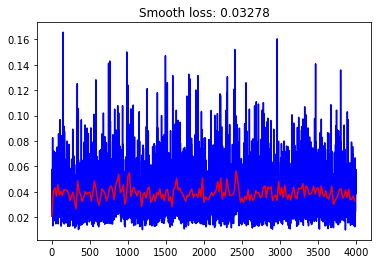

Loading dataset...
11001 0.019462768
11051 0.030577052
11101 0.02012902
11151 0.03001464
11201 0.06512128
11251 0.023354135
11301 0.01810249
11351 0.030807374
11401 0.040224865
11451 0.018209836


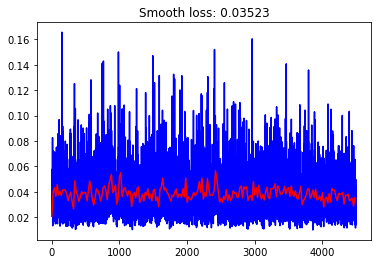

Loading dataset...
11501 0.04394831
11551 0.07021144
11601 0.09517073
11651 0.05035344
11701 0.03770576
11751 0.02275252
11801 0.07653558
11851 0.020846415
11901 0.020370767
11951 0.041871797


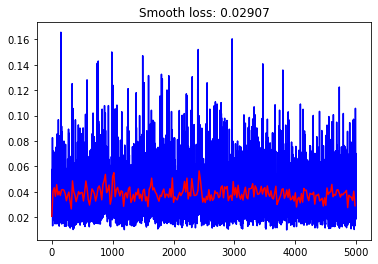

Loading dataset...
12001 0.029167026
12051 0.03448753
12101 0.096012086
12151 0.042415734
12201 0.03507616
12251 0.06465784
12301 0.015224682
12351 0.041900992
12401 0.063883774
12451 0.014713034


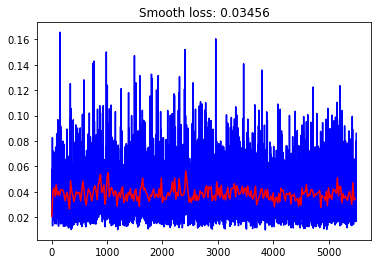

Loading dataset...
12501 0.035711195
12551 0.012952937
12601 0.068202436
12651 0.0145913055
12701 0.09375626
12751 0.036591884
12801 0.022921644
12851 0.05689147
12901 0.020088926
12951 0.08212932


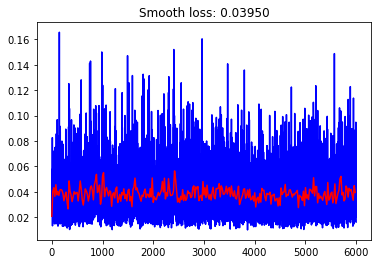

Loading dataset...
13001 0.022050856
13051 0.03655306
13101 0.040132478
13151 0.073803686
13201 0.053258665
13251 0.029070385
13301 0.050869793
13351 0.055660434
13401 0.026744045
13451 0.022188306


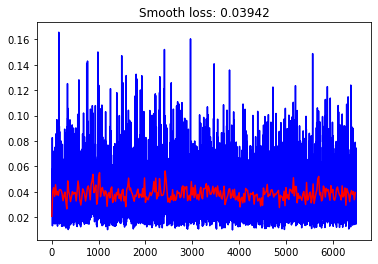

Loading dataset...
13501 0.020809017
13551 0.034500033
13601 0.040516578
13651 0.024211798
13701 0.015829071
13751 0.04921095
13801 0.03094669
13851 0.06503357
13901 0.02300434
13951 0.08651799


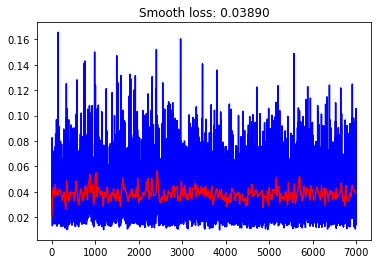

Loading dataset...
14001 0.040915165
14051 0.025850788
14101 0.020888794
14151 0.026942993
14201 0.03467043
14251 0.04085807
14301 0.032913353
14351 0.02770636
14401 0.079436615
14451 0.02587947


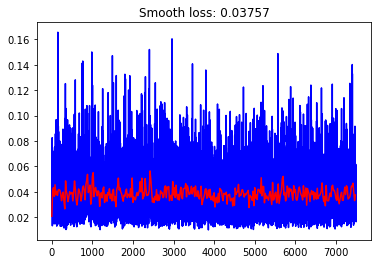

Loading dataset...
14501 0.03490452
14551 0.04037595
14601 0.03908811
14651 0.052869976
14701 0.03411107
14751 0.06416042


In [ ]:
losses = []
smoothed_losses = []

for step in range(7001,40000):
    loss, params, state, sn_state, opt_state = update(params, state, sn_state,
                                                      next(rng_seq), opt_state,
                                                      next(dset))
    
    losses.append(loss)
    if((step-1)%20==0):
        smooth_loss = np.array(losses[-20:]).mean()
        smoothed_losses.append(smooth_loss)
    if (step-1)%50==0:
        print(step, loss)
  
    if step%(10000//N_BATCH) ==0:
        title("Smooth loss: %2.5f"%(smooth_loss))
        plot(np.array(losses), 'b-')
        plot(20. * np.arange(len(smoothed_losses)), np.array(smoothed_losses), 'r-')
        show()    
        print("Loading dataset...")
        dset = load_dataset(N_BATCH, NOISE_STD, tfds.Split.TRAIN)
    if(step%1000==0):
        with open('../models/dm_score/model-%d.pckl'%step, 'wb') as file:            
            pickle.dump([params, state, sn_state], file)

In [32]:
def score_fn(y, s, x):
    score, _ = model.apply(params, state, None, y, s.reshape((-1,1,1,1)), is_training=False)
    return score

In [33]:
batch = next(dset)

In [34]:
score = score_fn(batch['y'], batch['s'], batch['x'])

In [35]:
from quarks2cosmos.lensing import measure_power_spectrum

resolution = 3.5 * 60 / N_map                # Pixel resolution in arcmin/pixel
pixel_size = np.pi * resolution / 180. / 60. # Pixel resolution in rad/pixel

In [36]:
def plot_1pt_ps(maps):
    true_map, noisy_map, _, denoised_map = maps 

    ell, ps_true     = measure_power_spectrum(true_map, pixel_size=pixel_size)
    ell, ps_noisy    = measure_power_spectrum(noisy_map, pixel_size=pixel_size)
    ell, ps_denoised = measure_power_spectrum(denoised_map, pixel_size=pixel_size)

    kappa_bins = np.linspace(-0.05, 0.10, 200)
    kappa_bin_centre = 0.5 * (kappa_bins[1:] + kappa_bins[:-1])

    true_hist, _     = np.histogram(true_map.flatten(), bins=kappa_bins, density=True)
    denoised_hist, _ = np.histogram(denoised_map.flatten(), bins=kappa_bins, density=True)
    noisy_hist, _    = np.histogram(noisy_map.flatten(), bins=kappa_bins, density=True)

    figure(figsize=[10,3.5])
    subplot(121)
    xlim(-0.05, 0.1)
    ylim(-0.01, 50.)
    xlabel('$\kappa$')
    ylabel('$P(\kappa)$')
    title('1 pt function')
    plot(kappa_bin_centre, true_hist, color='r', label='True map')
    plot(kappa_bin_centre, denoised_hist, color='b', label='Denoised map')
    plot(kappa_bin_centre, noisy_hist, color='g', label='Noisy map')
    legend()
    subplot(122)
    xlabel('$\ell$')
    ylabel('$C(\ell)$')
    title('Power spectrum')
    ylim(1e-12,2e-8)
    loglog(ell, ps_true, 'r', label='True map')
    loglog(ell, ps_denoised, 'b', label='Denoised map')
    loglog(ell, ps_noisy, 'g',  label='Noisy map')
    legend()
    show()    

In [37]:
from scipy import integrate

@jax.jit
def score_fn(y, s):
    score, _ = model.apply(params, state, None, y, s.reshape((-1,1,1,1)), is_training=False)
    return score

@jax.jit
def dynamics(t, x):
  x = x.reshape([-1,N_map,N_map,1])
  return - 0.5*score_fn(x, s=jnp.ones([1])*jnp.sqrt(t)).reshape([-1])

def get_denoised_map(noisy_map, noise):
    start_and_end_times = jnp.logspace(log10(0.99*noise**2),-10)

    solution = integrate.solve_ivp(dynamics, 
                               [noise**2,(0.0)], 
                               noisy_map.flatten(),
                               t_eval=start_and_end_times)
    return solution.y[:,-1].reshape(N_map,N_map)

In [38]:
def plot_denoising_map(maps, savename=None):
    true_image, noisy_map, _, denoised_map = maps
    figure(figsize=[15,5])
    subplot(131)
    title('Gaussian map')
    imshow(true_image)
    subplot(132)
    title('Noisy map')
    imshow(noisy_map)
    subplot(133)
    title('Denoised Gaussian map')
    imshow(denoised_map)
    if savename is not None:
        plt.savefig(savename, dpi=150)
    plt.show()

Noise: 0.010
i: 0


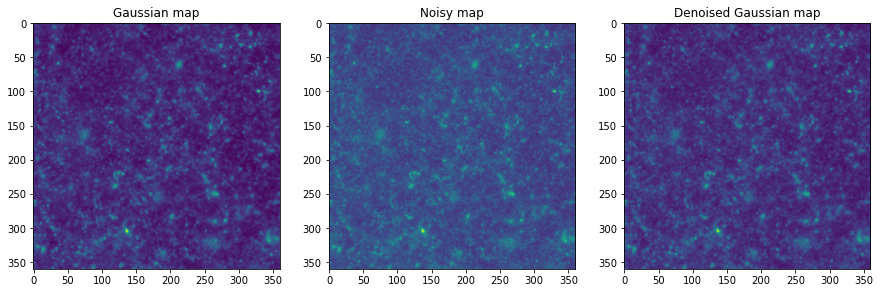

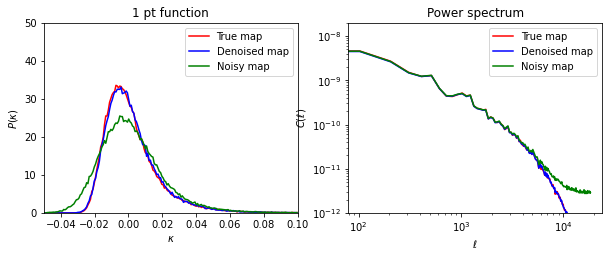

Noise: 0.020
i: 1


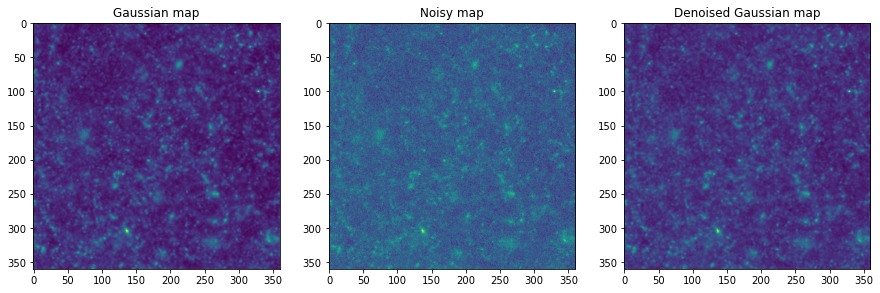

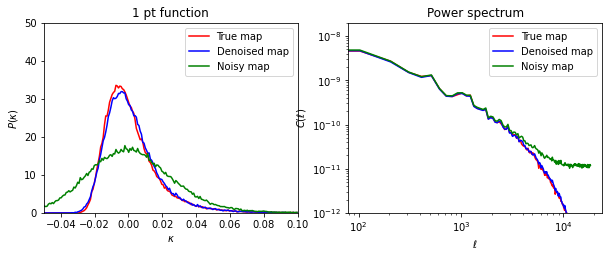

Noise: 0.030
i: 2


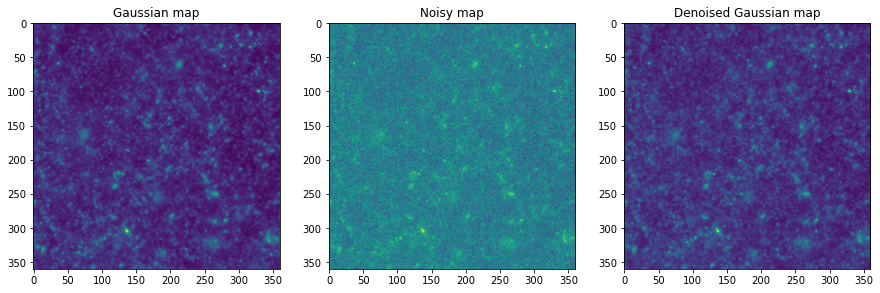

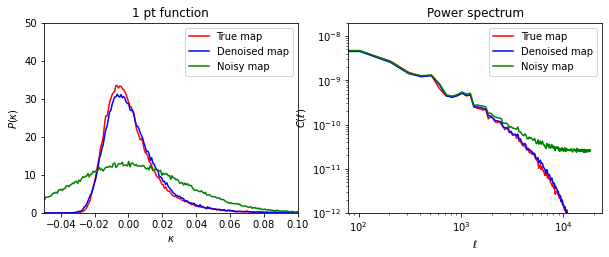

Noise: 0.040
i: 3


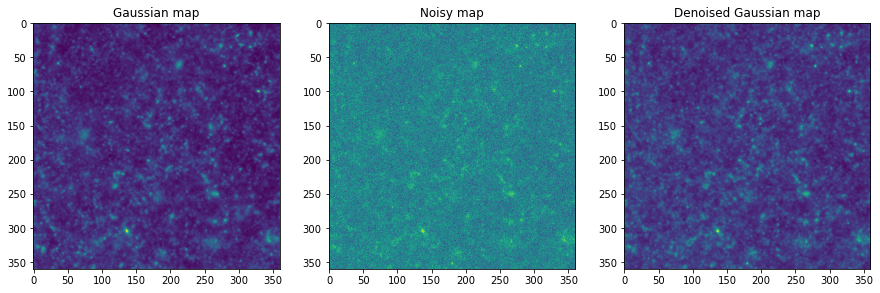

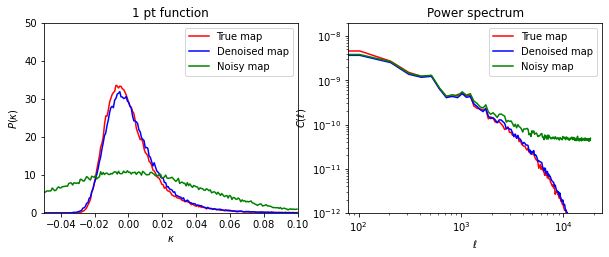

Noise: 0.050
i: 4


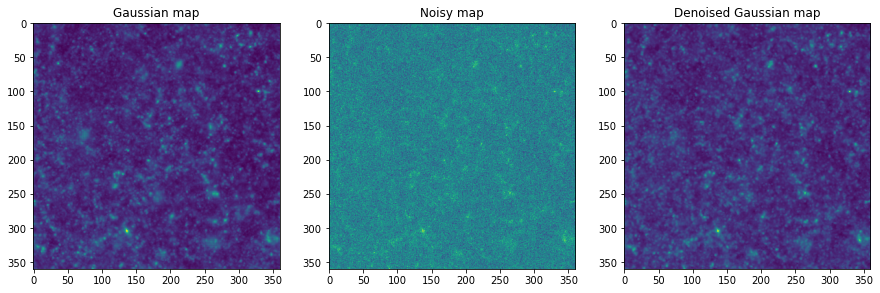

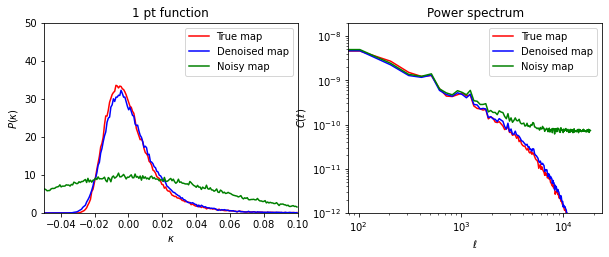

Noise: 0.060
i: 5


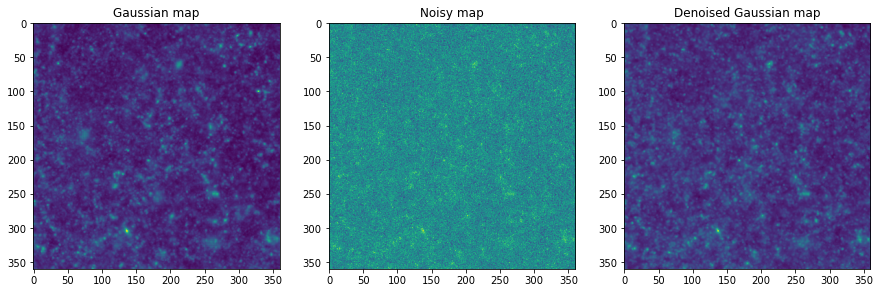

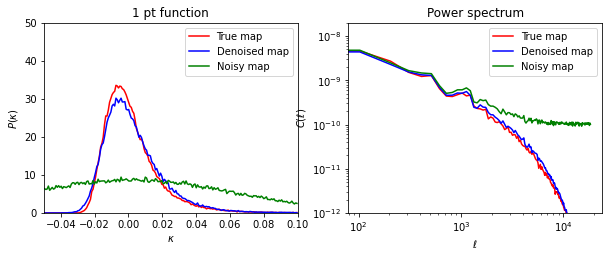

Noise: 0.070
i: 6


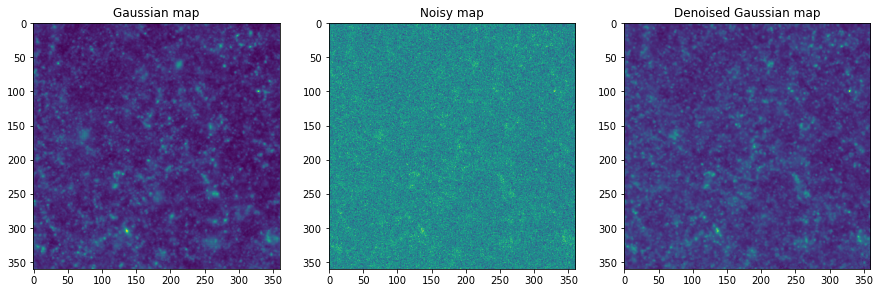

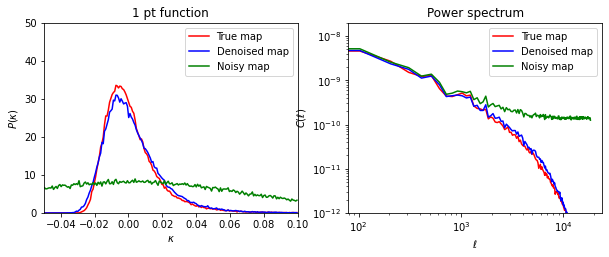

Noise: 0.080
i: 7


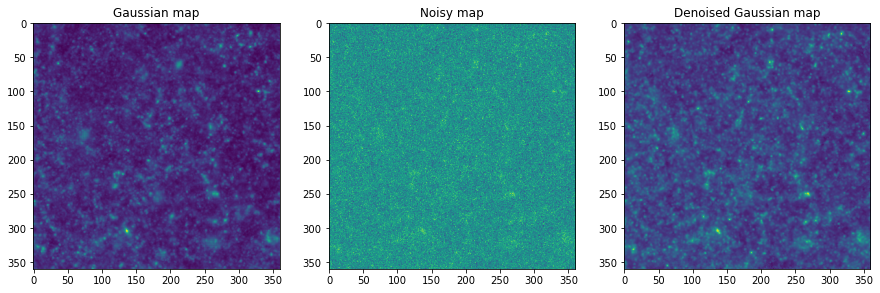

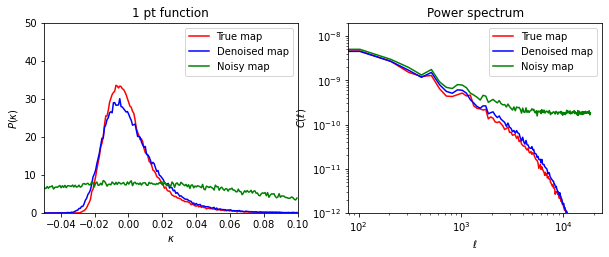

Noise: 0.090
i: 8


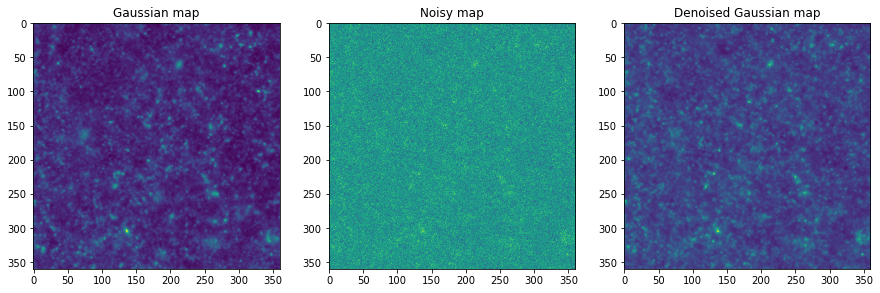

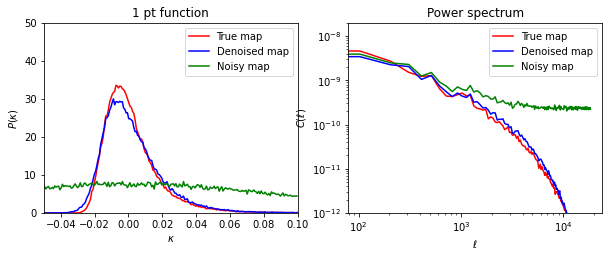

Noise: 0.100
i: 9


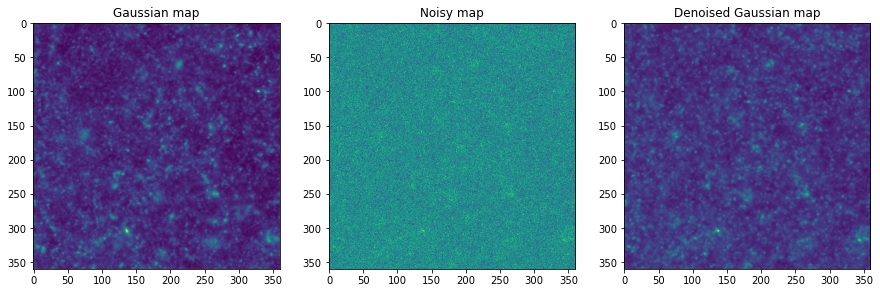

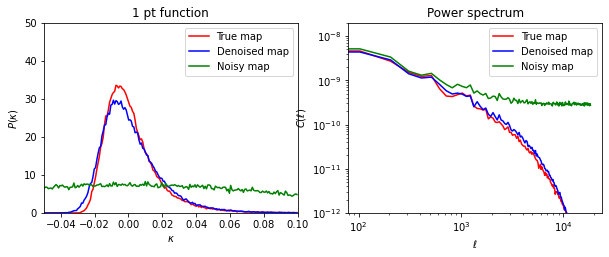

Noise: 0.110
i: 10


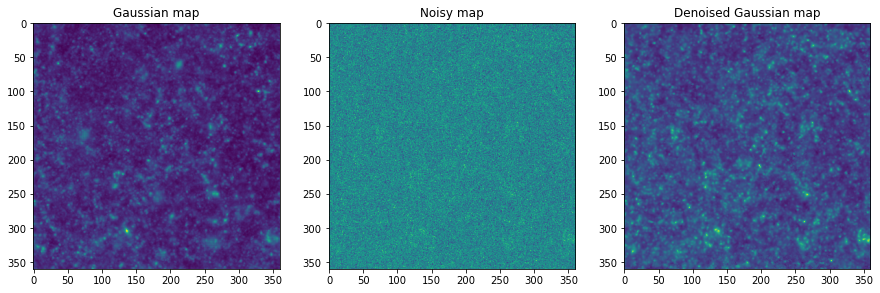

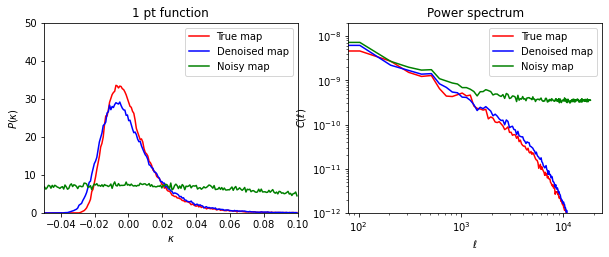

Noise: 0.120
i: 11


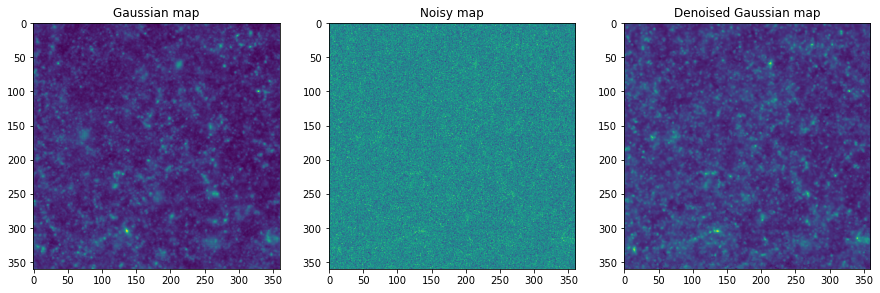

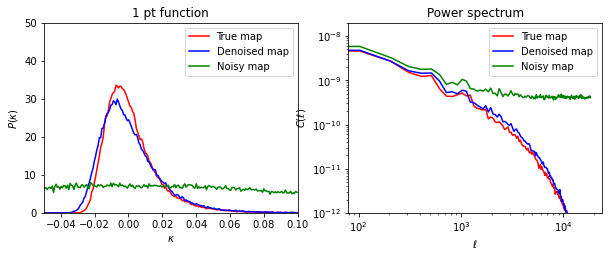

Noise: 0.130
i: 12


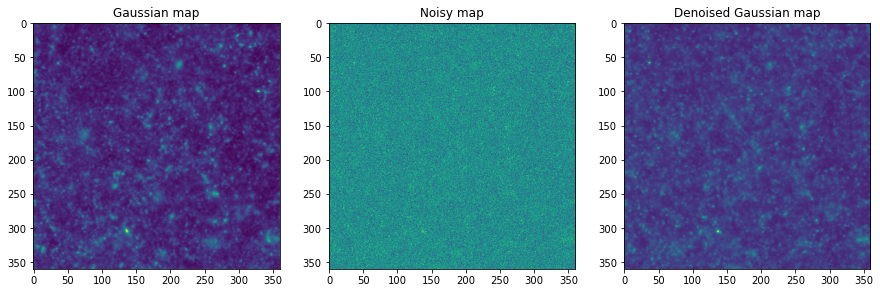

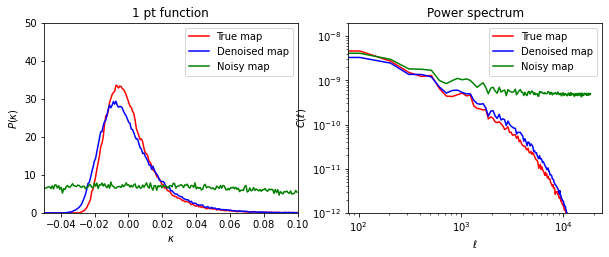

Noise: 0.140
i: 13


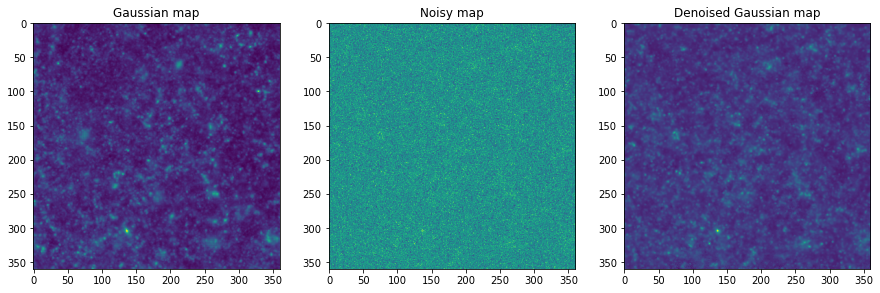

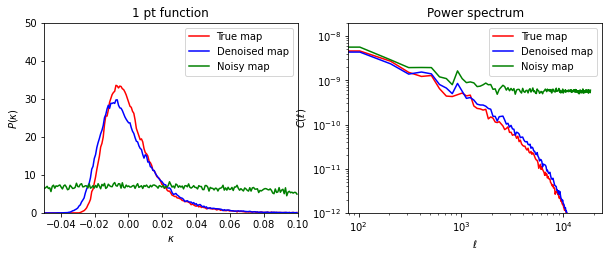

Noise: 0.150
i: 14


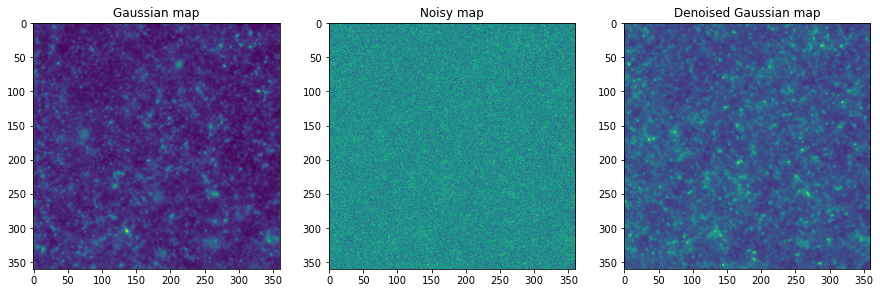

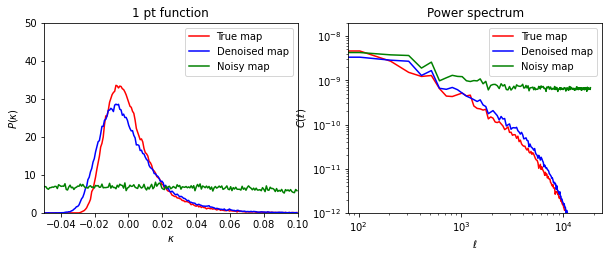

Noise: 0.160
i: 15


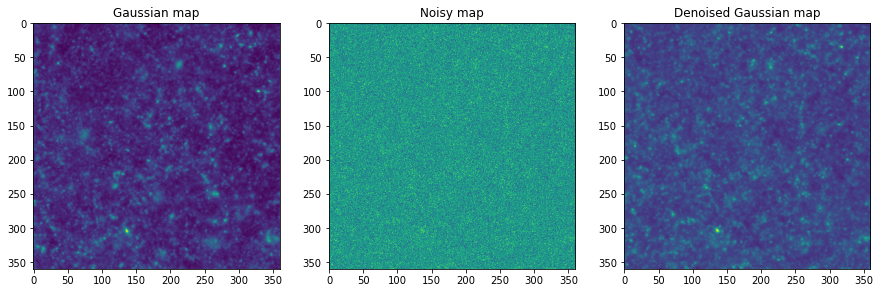

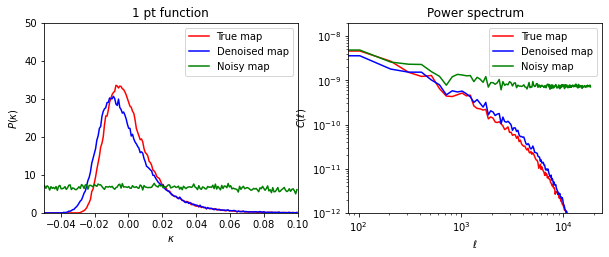

Noise: 0.170
i: 16


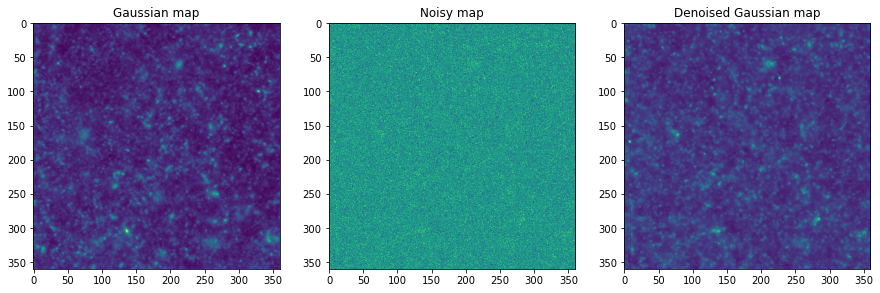

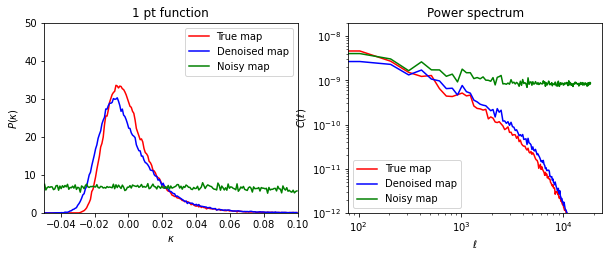

Noise: 0.180
i: 17


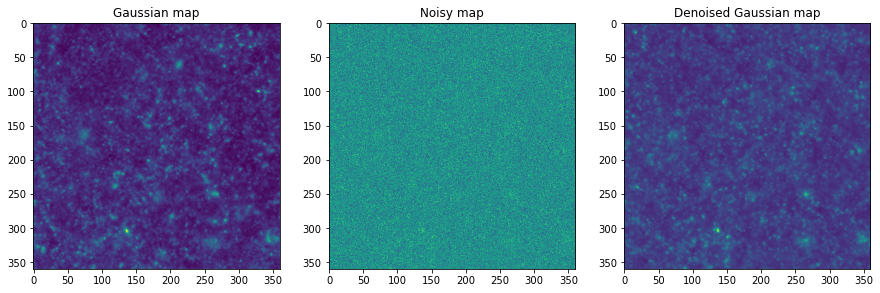

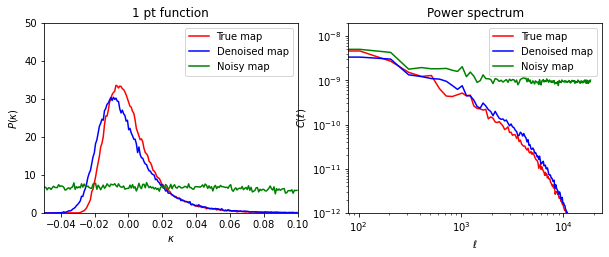

Noise: 0.190
i: 18


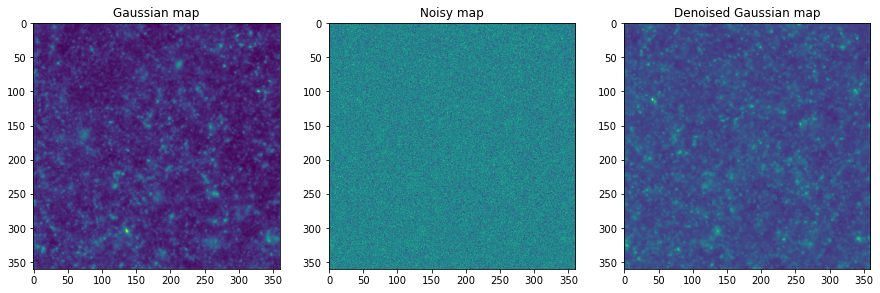

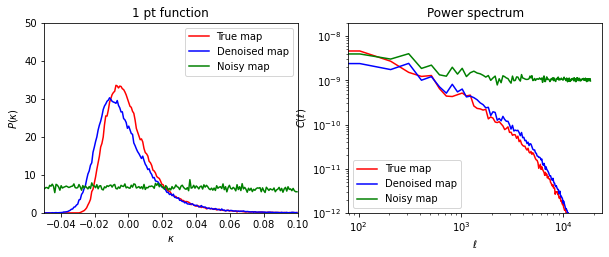

Noise: 0.200
i: 19


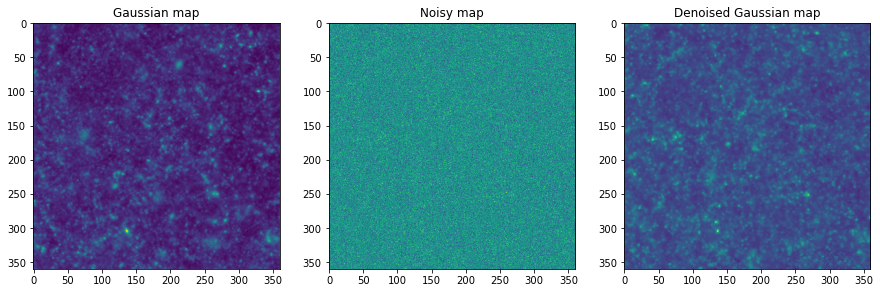

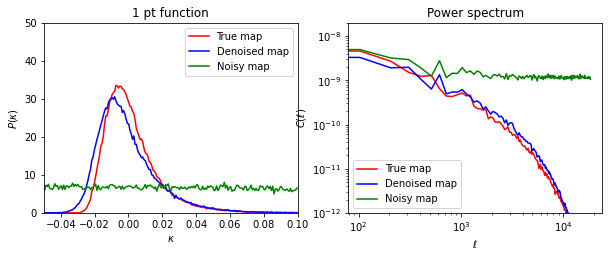

In [39]:
for i in range(20):
    noise = 0.01 * (i + 1)
    
    print("Noise: %2.3f"%(noise))
    print("i: %d"%(i))
    
    noisy_image = batch['x'][0] + noise*randn(1,N_map,N_map,1)
    denoised_image = get_denoised_map(noisy_image, noise)

    maps = [batch['x'][0,...,0], noisy_image[0,...,0], None, denoised_image]
    plot_denoising_map(maps)
    plot_1pt_ps(maps)
    show()

In [40]:
from astropy import units as u
from lenstools import ConvergenceMap

angle = 3.5 * u.deg
smoothing_scale = 1. * u.arcminute

/jet/home/supranta/.local/lib/python3.7/site-packages/lenstools/utils/mpi.py:15: UserWarning: Could not import mpi4py! (if you set sys.modules['mpi4py']=None please disregard this message)
  warnings.warn(wmsg)


In [41]:
dset = load_dataset(N_BATCH, NOISE_STD, tfds.Split.TRAIN)

resolution = 3.5 * 60 / N_map                  # Pixel resolution in arcmin/pixel
pixel_size = np.pi * resolution / 180. / 60. # Pixel resolution in rad/pixel

from quarks2cosmos.lensing import measure_power_spectrum
cl_list = []

for i in range(500):
    m = next(dset)
    kappa_batch = m['x']
    # We can also compute the power spectra of these various maps
    for kappa in kappa_batch:
        ell_measured, cl_measured = measure_power_spectrum(kappa[...,0], pixel_size=pixel_size)
        cl_list.append(cl_measured)
        
cl_measured_arr = jnp.array(cl_list)        

cl_mean = jnp.mean(cl_measured_arr, axis=0)
cl_lower = jnp.percentile(cl_measured_arr, 2.5, axis=0)
cl_upper = jnp.percentile(cl_measured_arr, 97.5, axis=0)

In [42]:
import jax_cosmo as jc

z_sample = 1. + np.random.normal(0.002, size=(10000))
pz = jc.redshift.kde_nz(jnp.array(z_sample),
                        jnp.ones(10000), bw=0.001)

@jax.jit
def theory_cl(ell):
    """ Computes angular C_ell for our survey, at given ell
    """
    cosmo = jc.Planck15()
    tracer = jc.probes.WeakLensing([pz])
    return jc.angular_cl.angular_cl(cosmo, ell, [tracer])[0]

In [43]:
ell = jnp.logspace(2,5)
cl_theory = theory_cl(ell)

/jet/home/supranta/.local/lib/python3.7/site-packages/jax/_src/numpy/lax_numpy.py:5792: UserWarning: Explicitly requested dtype <class 'jax._src.numpy.lax_numpy.int64'> requested in astype is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  lax._check_user_dtype_supported(dtype, "astype")


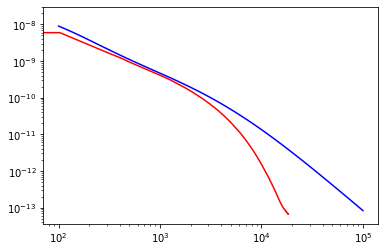

In [44]:
loglog(ell, cl_theory, 'b-')
loglog(ell_measured, cl_mean, 'r-')

In [50]:
true_map_obj = ConvergenceMap(kappa_batch[0,...,0], angle)
ell_modes = true_map_obj.getEll()

In [51]:
from scipy.interpolate import interp1d

log_cl_interp = interp1d(np.log10(ell), np.log10(cl_theory))

select_positive_ell = ell_modes != 0
cl_modes = np.zeros_like(ell_modes)
cl_modes[select_positive_ell] = 10**log_cl_interp(np.log10(ell_modes[select_positive_ell]))

In [52]:
def get_Gaussian_map():
    theta_max = 3.5 * np.pi / 180.
    Omega_s = theta_max**2
    
    x = np.random.normal(size=(N_map, N_map))
    F_x = jnp.fft.rfftn(x)
    F_kappa = F_x * np.sqrt(cl_modes / Omega_s * N_map * N_map)
    kappa_g = jnp.fft.irfftn(F_kappa)
    gauss_map_obj = ConvergenceMap(kappa_g, angle)
    
    return gauss_map_obj

In [54]:
# ell_bin_centre, Cl_gauss = gauss_map_obj.powerSpectrum(ell_bins)

In [ ]:
loglog(ell, cl_theory, 'b-')
loglog(ell_measured, cl_mean, 'r-')
loglog(ell_bin_centre, Cl_gauss, 'g--')

In [55]:
def get_summary_stats(map_obj):
    thresholds = np.arange(-0.03, 0.23, 0.01)
    mf_thresholds = np.arange(-2.0,2.0,0.2)
    kappa_bins = np.linspace(-0.05, 0.10, 200)
    kappa_bin_centre = 0.5 * (kappa_bins[1:] + kappa_bins[:-1])
    
    peak_data = map_obj.peakCount(thresholds)
    MF_data = map_obj.minkowskiFunctionals(mf_thresholds,norm=True)

    pdf, _ = np.histogram(map_obj.data.flatten(), bins=kappa_bins, density=True)
    pdf_data = [kappa_bin_centre, pdf]
    
    ell_bins = np.logspace(2,4,21)
    Cl_data = map_obj.powerSpectrum(ell_bins)

    return Cl_data, pdf_data, peak_data, MF_data

In [56]:
smoothing_scale = 0.5 * u.arcminute

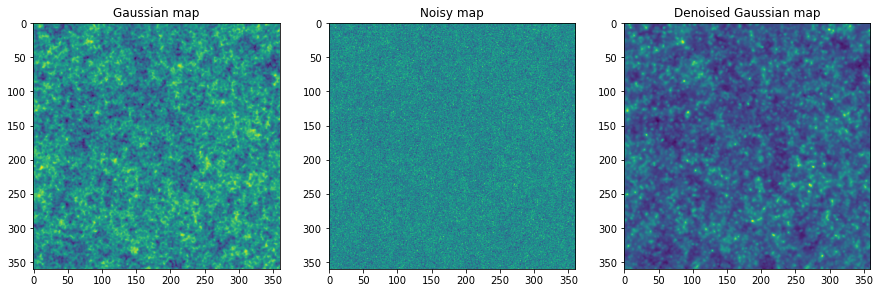

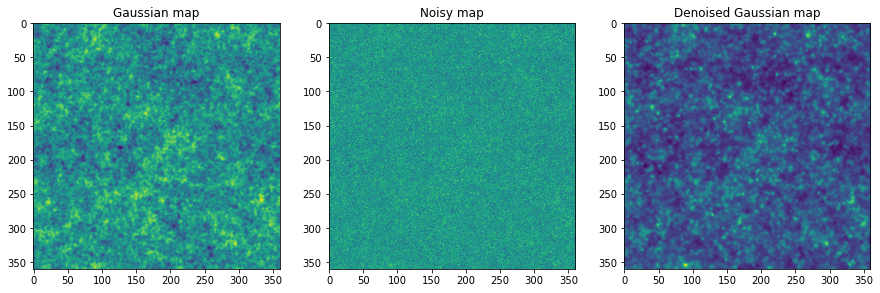

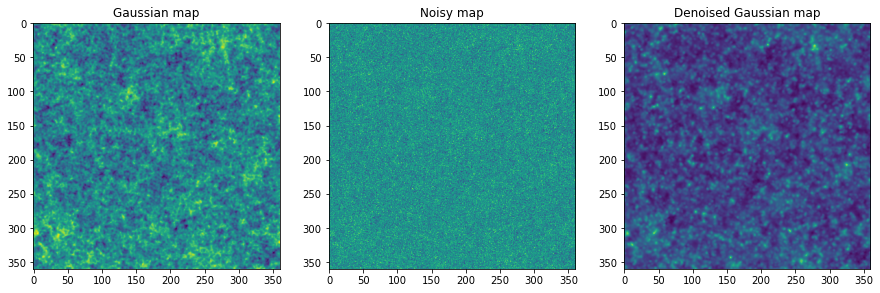

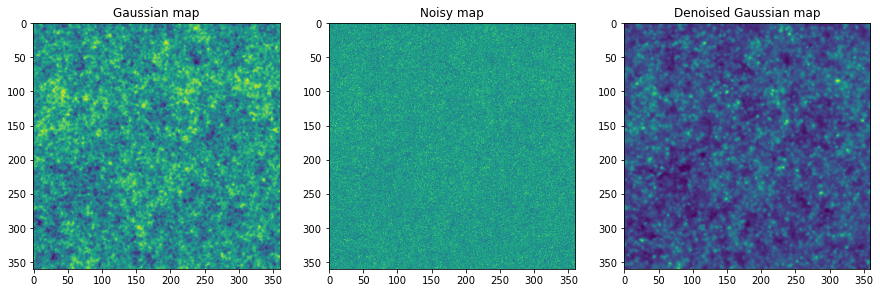

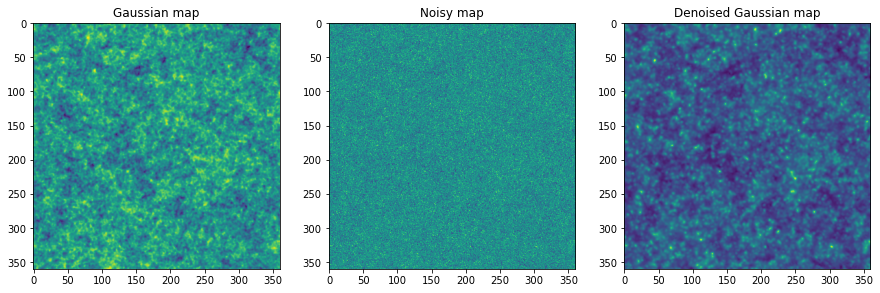

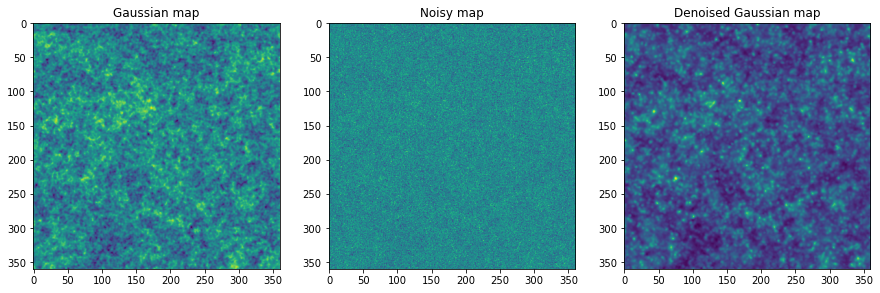

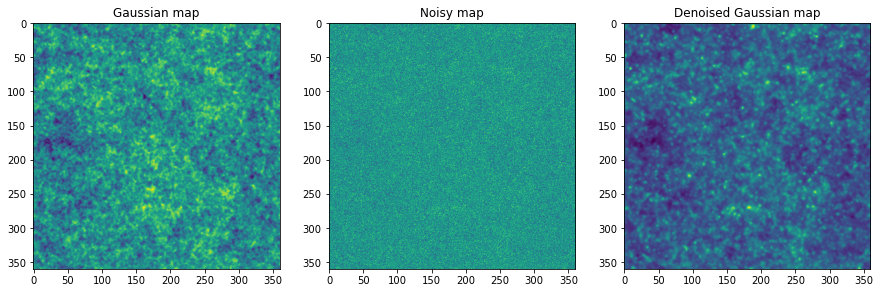

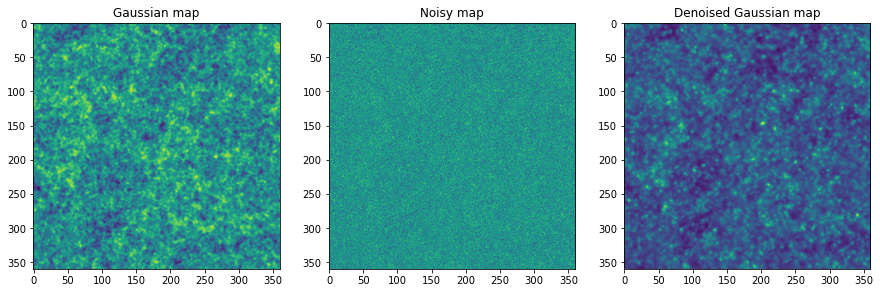

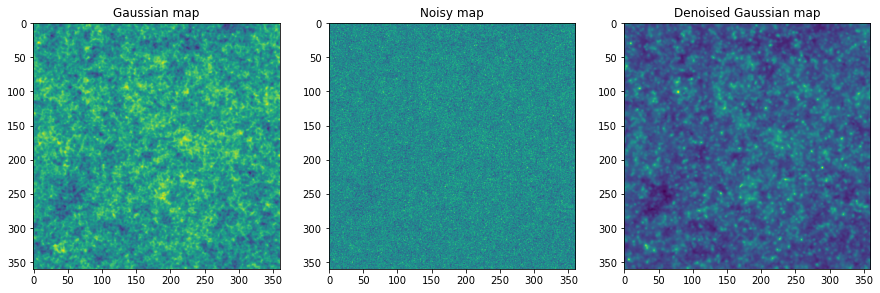

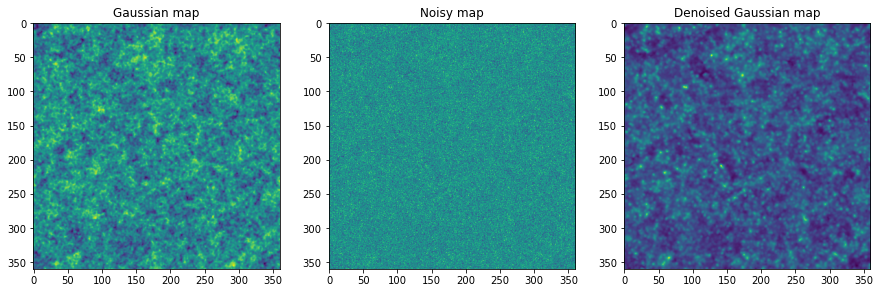

KeyboardInterrupt: 

In [57]:
gaussian_summary_list = []
sampled_summary_list = []

noise = 0.1

for i in range(500):
    savename = None
    gaussian_map_obj = get_Gaussian_map()
    true_gaussian_map = gaussian_map_obj.data
    
    noisy_map = true_gaussian_map[jnp.newaxis,...,jnp.newaxis] + noise * randn(1,N_map,N_map,1)
    sampled_map = get_denoised_map(noisy_map, noise)
    
    sampled_map_obj = ConvergenceMap(sampled_map, angle).smooth(smoothing_scale)

    gaussian_map_obj = gaussian_map_obj.smooth(smoothing_scale)
    
    maps = [gaussian_map_obj.data, 
            noisy_map[0,...,0], None, sampled_map_obj.data]
    
    if(i%10==0):
        savename = 'figs/DM_score/gauss_maps_0.1/%d.png'%(i//10)
        plot_denoising_map(maps, savename)
    
    gaussian_summary = get_summary_stats(gaussian_map_obj)
    sampled_summary = get_summary_stats(sampled_map_obj)
    
    sampled_summary_list.append(sampled_summary)
    gaussian_summary_list.append(gaussian_summary)
#     plot_1pt_ps(maps)

In [289]:
# dset = load_dataset(1, 0., tfds.Split.TRAIN)
# massive_nu_summary_list = []

# for i in range(1000):
#     if(i%10==0):
#         print(i)
#     massive_nu_map = next(dset)
#     massive_nu_obj = ConvergenceMap(massive_nu_map['x'][0,...,0], angle).smooth(smoothing_scale)
    
#     massive_nu_summary = get_summary_stats(massive_nu_obj)
#     massive_nu_summary_list.append(massive_nu_summary)

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
210
220
230
240
250
260
270
280
290
300
310
320
330
340
350
360
370
380
390
400
410
420
430
440
450
460
470
480
490
500
510
520
530
540
550
560
570
580
590
600
610
620
630
640
650
660
670
680
690
700
710
720
730
740
750
760
770
780
790
800
810
820
830
840
850
860
870
880
890
900
910
920
930
940
950
960
970
980
990


In [291]:
# for i in range(20):
#     massive_nu_map = next(dset)
#     massive_nu_obj = ConvergenceMap(massive_nu_map['x'][0,...,0], angle).smooth(smoothing_scale)
    
#     np.save('dm_score/simple/massive_nu_maps/%d.npy'%(i), massive_nu_obj.data)

In [58]:
import h5py as h5
def save_summary_stats(summary_list, filename):
    N_samples = len(summary_list)
    
    Cl_list = []
    pdf_list = []
    peak_counts_list = []
    MF_list = []
    
    for i in range(N_samples):
        Cl_data, pdf_data, peak_data, MF_data = summary_list[i]
        ell, Cl = Cl_data
        kappa_bin_centre, pdf = pdf_data
        peak_thresholds, peak_counts = peak_data
        MF_threshold, V0, V1, V2 = MF_data

        Cl_list.append(Cl)
        pdf_list.append(pdf)
        peak_counts_list.append(peak_counts)
        MF_list.append(np.array([V0, V1, V2]))
        
    with h5.File(filename, 'w') as f: 
        f['ell'] = ell
        f['Cl'] = np.array(Cl_list)
        
        f['kappa_pdf'] = kappa_bin_centre
        f['pdf'] = np.array(pdf_list)
        
        f['peak_threshold'] = peak_thresholds
        f['peak_counts'] = np.array(peak_counts_list)
        
        f['MF_thresholds'] = MF_threshold
        f['MF'] = np.array(MF_list)

In [59]:
gaussian_summary_stats_fname = 'dm_score/simple/summary_stats/0.1/gauss.h5'
sampled_summary_stats_fname  = 'dm_score/simple/summary_stats/0.1/denoised.h5'
# massive_nu_summary_stats_fname = 'dm_score/simple/summary_stats/massive_nu.h5'

In [60]:
save_summary_stats(gaussian_summary_list, gaussian_summary_stats_fname)
save_summary_stats(sampled_summary_list, sampled_summary_stats_fname)
# save_summary_stats(massive_nu_summary_list, massive_nu_summary_stats_fname)